# User Experience Analytics
we delve into the realm of user experience analysis within the telecommunications industry. Focusing on <br> network parameters such as:
- TCP retransmission
- Round Trip Time (RTT)
- throughput
- handset types

we aim to gain insights into the users' perceptions and optimize services accordingly.

### Import Packages

In [1]:
import pickle
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, normalize
import numpy as np
import sys, os
import pandas as pd

In [2]:
sys.path.append(os.path.abspath(os.path.join('../src')))

In [3]:

from data_loader import load_data
from data_cleaning_utils import DataCleaningUtil
from plot_utils import PlotUtil

cleaning_utils = DataCleaningUtil()
plot_utls = PlotUtil()

### Load the dataset

In [4]:
# Connection parameters
connection_params = {
    "host": "localhost",
    "user": "birehan",
    "password": "password",
    "port": "5432",
    "database": "tellco_db"  # Change to your desired database name
}
table_name = "public.xdr_data_cleaned"
file_path = "../data/cleaned_tellco_data.csv"

df = load_data(connection_params, table_name, file_path)
print(df.head())

2023-12-16 14:45:21,943:logger:Successfully fetched data from the database.
2023-12-16 14:45:22,011:logger:Database connection closed.


   Unnamed: 0     bearer_id                start  start_ms  \
0           0  1.311448e+19  2019-04-04 12:01:00     770.0   
1           1  1.311448e+19  2019-04-09 13:04:00     235.0   
2           2  1.311448e+19  2019-04-09 17:42:00       1.0   
3           3  1.311448e+19  2019-04-10 00:31:00     486.0   
4           4  1.311448e+19  2019-04-12 20:10:00     565.0   

                   end  end_ms     dur_ms          imsi  msisdn_number  \
0  2019-04-25 14:35:00   662.0  244908.75  2.082014e+14   3.366496e+10   
1  2019-04-25 08:15:00   606.0  244908.75  2.082019e+14   3.368185e+10   
2  2019-04-25 11:58:00   652.0  244908.75  2.082008e+14   3.373458e+10   
3  2019-04-25 07:36:00   171.0  244908.75  2.082014e+14   3.373458e+10   
4  2019-04-25 10:40:00   954.0  244908.75  2.082014e+14   3.369980e+10   

           imei  ... google_total_bytes  email_total_bytes  \
0  3.552121e+13  ...          2905912.0          3701304.0   
1  3.579401e+13  ...          4414096.0           937385.0

### Pre processing the required fields

In [5]:
# Selecting only the desired columns
exp_df = df[['handset_type', 'msisdn_number', 'total_avg_bearer_tp_kbps', 'total_tcp_dl_retrans_vol_bytes', 'total_avg_rtt_dl_ms']].copy()

exp_df.columns

Index(['handset_type', 'msisdn_number', 'total_avg_bearer_tp_kbps',
       'total_tcp_dl_retrans_vol_bytes', 'total_avg_rtt_dl_ms'],
      dtype='object')

In [6]:
exp_df.head()

,handset_type,msisdn_number,total_avg_bearer_tp_kbps,total_tcp_dl_retrans_vol_bytes,total_avg_rtt_dl_ms
0,Samsung Galaxy A5 Sm-A520F,3.366496e+10,67.0,7843913.125,47.0
1,Samsung Galaxy J5 (Sm-J530),3.368185e+10,42.0,7843913.125,70.0
2,Samsung Galaxy A8 (2018),3.373458e+10,15.0,7843913.125,70.0
3,undefined,3.373458e+10,88.0,7843913.125,70.0
4,Samsung Sm-G390F,3.369980e+10,15.0,7843913.125,70.0


In [7]:
cleaning_utils.get_missing_values_percent(exp_df)

2023-12-16 14:45:22,236:logger:Get missing values percentage from dataframe


,missing_percent
handset_type,0.0
msisdn_number,0.0
total_avg_bearer_tp_kbps,0.0
total_tcp_dl_retrans_vol_bytes,0.0
total_avg_rtt_dl_ms,0.0


####  Aggregate Customer Information

In [8]:
agg_exp_df = exp_df.groupby('msisdn_number').agg(
    {'total_avg_rtt_dl_ms': 'sum', 'total_avg_bearer_tp_kbps': 'sum', 'total_tcp_dl_retrans_vol_bytes': 'sum',
    'handset_type': lambda x: x.mode().iloc[0] if not x.mode().empty else None
                          })
agg_exp_df.head()

,total_avg_rtt_dl_ms,total_avg_bearer_tp_kbps,total_tcp_dl_retrans_vol_bytes,handset_type
msisdn_number,,,,
3.360167e+10,20127.0,3516726.25,6.870748e+08,Apple iPhone 7 (A1778)
3.360171e+10,115.0,70.00,6.587000e+03,Apple iPhone Se (A1723)
3.360171e+10,128.0,9792.00,6.192340e+05,Apple iPhone 6 (A1586)
3.360171e+10,238.0,50605.25,1.559840e+07,Samsung Galaxy S8 Plus (Sm-G955F)
3.360171e+10,34.0,117.00,5.784310e+05,Apple iPhone 7 Plus (A1784)


#### The top, bottom, and most frequent values for TCP, RTT, and throughput in the dataset.

##### The top, bottom, and most frequent values of TCP

In [9]:
sorted_by_tcp = exp_df.sort_values(
    'total_tcp_dl_retrans_vol_bytes', ascending=False)
top_10 = sorted_by_tcp.head(10)['total_tcp_dl_retrans_vol_bytes']
bottom_10 = sorted_by_tcp.tail(10)['total_tcp_dl_retrans_vol_bytes']
most_frequent_10 = exp_df['total_tcp_dl_retrans_vol_bytes'].value_counts().head(10)
exp_df.columns


Index(['handset_type', 'msisdn_number', 'total_avg_bearer_tp_kbps',
       'total_tcp_dl_retrans_vol_bytes', 'total_avg_rtt_dl_ms'],
      dtype='object')

In [10]:
plot_utls.multi_hist([top_10, bottom_10, most_frequent_10], 1, 3,
    "Total TCP values", ['Top 10', 'Bottom 10', ' Frequent 10'])

##### The top, bottom, and most frequent values of RTT

In [11]:
sorted_by_tcp = exp_df.sort_values(
    'total_avg_rtt_dl_ms', ascending=False)
top_10 = sorted_by_tcp.head(10)['total_avg_rtt_dl_ms']
bottom_10 = sorted_by_tcp.tail(10)['total_avg_rtt_dl_ms']
most_frequent_10 = exp_df['total_avg_rtt_dl_ms'].value_counts().head(10)


In [12]:
plot_utls.multi_hist([top_10, bottom_10, most_frequent_10], 1, 3,
    "Total RTT values", ['Top 10', 'Bottom 10', ' Frequent 10'])

##### The top, bottom, and most frequent values of Throughput

In [33]:
sorted_by_tp = exp_df.sort_values(
    'total_avg_bearer_tp_kbps', ascending=False)
top_10 = sorted_by_tp.head(10)['total_avg_bearer_tp_kbps']
bottom_10 = sorted_by_tp.tail(10)['total_avg_bearer_tp_kbps']
most_frequent_10 = exp_df['total_avg_bearer_tp_kbps'].value_counts().head(10)


In [42]:
plot_utls.multi_hist([top_10, bottom_10, most_frequent_10], 1, 3,
    "Total Throughput values", ['Top 10', 'Bottom 10', ' Frequent 10'])

#### The distribution of the average throughput  per handset type

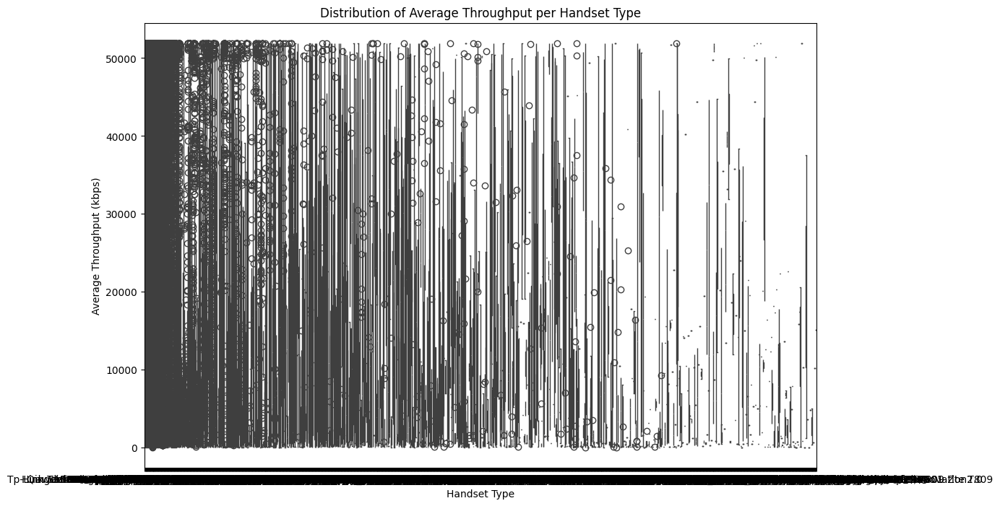

In [15]:
plot_utls.plot_distribution(exp_df, 'handset_type', 'total_avg_bearer_tp_kbps',
                  'Distribution of Average Throughput per Handset Type',
                  'Handset Type', 'Average Throughput (kbps)')


In [16]:
handset_type_df = exp_df.groupby('handset_type').agg(
    {'total_avg_bearer_tp_kbps': 'mean', 'total_tcp_dl_retrans_vol_bytes': 'mean'})
handset_type_df.head()

,total_avg_bearer_tp_kbps,total_tcp_dl_retrans_vol_bytes
handset_type,,
A-Link Telecom I. Cubot A5,23510.00,793127.000
A-Link Telecom I. Cubot Note Plus,6699.00,616213.000
A-Link Telecom I. Cubot Note S,8937.00,7742302.625
A-Link Telecom I. Cubot Nova,49759.25,137170.000
A-Link Telecom I. Cubot Power,49551.25,8041.000


In [17]:
sorted_by_tp = handset_type_df.sort_values(
    'total_avg_bearer_tp_kbps', ascending=False)
top_tp = sorted_by_tp['total_avg_bearer_tp_kbps']
plot_utls.hist(top_tp.head(20))

#### The average TCP retransmission view per handset type

In [18]:
sorted_by_tcp = handset_type_df.sort_values(
    'total_tcp_dl_retrans_vol_bytes', ascending=False)
top_tcp = sorted_by_tcp['total_tcp_dl_retrans_vol_bytes']
top_tcp.head()

handset_type
Huawei E587 E587U-2 Turkcell Vinnwifi E587                 7843913.125
Hongkong Ipro Te. Ipro I9350 I9400 S3 Wave 3.5 Wave 4.0    7843913.125
Lg-X210Ds                                                  7843913.125
Asustek Asus Zenfone Selfie Zd551Kl                        7843913.125
Lg K10 2017                                                7843913.125
Name: total_tcp_dl_retrans_vol_bytes, dtype: float64

In [19]:
plot_utls.hist(top_tcp.head(20))

#### k-means clustering (where k = 3) to segment users into groups of experiences

In [20]:
exp_metric_df = agg_exp_df[[
  'total_avg_bearer_tp_kbps', 'total_avg_rtt_dl_ms', 'total_tcp_dl_retrans_vol_bytes']].copy()
exp_metric_df.head()

,total_avg_bearer_tp_kbps,total_avg_rtt_dl_ms,total_tcp_dl_retrans_vol_bytes
msisdn_number,,,
3.360167e+10,3516726.25,20127.0,6.870748e+08
3.360171e+10,70.00,115.0,6.587000e+03
3.360171e+10,9792.00,128.0,6.192340e+05
3.360171e+10,50605.25,238.0,1.559840e+07
3.360171e+10,117.00,34.0,5.784310e+05


#### Check for outliers

<Axes: >

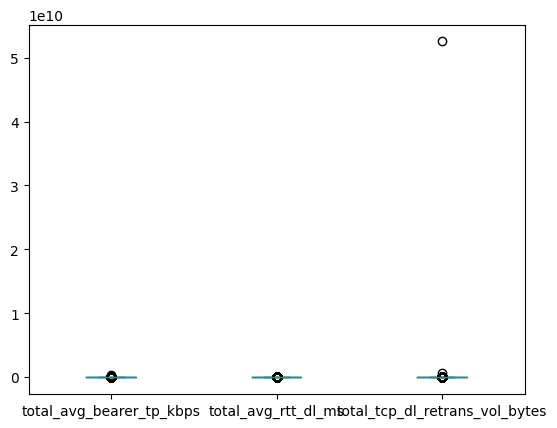

In [21]:
exp_metric_df.plot.box()

In [22]:
exp_metric_df = cleaning_utils.fix_outliers(exp_metric_df)

2023-12-16 14:45:55,112:logger:Fix outliers


<Axes: >

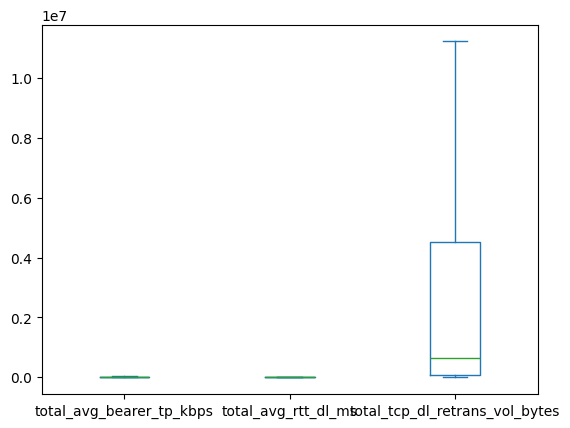

In [23]:
exp_metric_df.plot.box()

#### Scale the variables

In [24]:
scaler = StandardScaler()
scaled_array = scaler.fit_transform(exp_metric_df)
scaled_array
pd.DataFrame(scaled_array).head(5)

,0,1,2
0,2.352367,2.804867,2.543016
1,-0.676421,0.577959,-0.757633
2,-0.194150,0.811426,-0.577260
3,1.830439,2.786908,2.543016
4,-0.674089,-0.876714,-0.589273


#### Normalize the dataset

In [25]:
data_normalized = normalize(scaled_array)
pd.DataFrame(data_normalized).head(5)

,0,1,2
0,0.527752,0.629270,0.570524
1,-0.578838,0.494581,-0.648334
2,-0.191363,0.799780,-0.568975
3,0.436509,0.664600,0.606438
4,-0.537936,-0.699635,-0.470251


In [26]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(data_normalized)
kmeans.labels_

/home/babi/anaconda3/envs/tenx_week1/lib/python3.12/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



array([2, 1, 2, ..., 1, 0, 2], dtype=int32)

In [27]:
exp_metric_df.insert(0, 'cluster', kmeans.labels_)
exp_metric_df

,cluster,total_avg_bearer_tp_kbps,total_avg_rtt_dl_ms,total_tcp_dl_retrans_vol_bytes
msisdn_number,,,,
3.360167e+10,2,61126.6875,239.0,1.121739e+07
3.360171e+10,1,70.0000,115.0,6.587000e+03
3.360171e+10,2,9792.0000,128.0,6.192340e+05
3.360171e+10,2,50605.2500,238.0,1.121739e+07
3.360171e+10,1,117.0000,34.0,5.784310e+05
...,...,...,...,...
3.370000e+10,1,15.0000,62.5,2.160660e+05
3.370000e+10,1,4475.0000,132.0,8.955160e+05
3.370000e+10,1,8192.0000,29.0,1.354000e+04


In [28]:
exp_metric_df['cluster'].value_counts()

1    45899
2    27801
0    16338
Name: cluster, dtype: int64

In [29]:
plot_utls.plot_scatter_cluster(exp_metric_df,
                            x_column='total_avg_rtt_dl_ms',
                            y_column='total_avg_bearer_tp_kbps',
                            color_column='cluster',
                            size_column='total_tcp_dl_retrans_vol_bytes',
                            title='Scatter Plot of User Experience Metrics')


In [30]:
plot_utls.plot_3d_scatter(exp_metric_df,
                                  x_column='total_avg_rtt_dl_ms',
                                  y_column='total_avg_bearer_tp_kbps',
                                  z_column='total_tcp_dl_retrans_vol_bytes',
                                  color_column='cluster',
                                  rotation=[-1.5, -1.5, 1],
                                  title='3D Scatter Plot of User Experience Metrics')

#### Save the user experience dataframe

In [31]:
exp_metric_df.to_csv('../data/tellco_user_experience_data.csv')

#### Save the mode as pickle

In [32]:
with open("../models/tellco_user_experience.pkl", "wb") as f:
    pickle.dump(kmeans, f)